In [ ]:
! git clone https://github.com/Harry24k/adversarial-attacks-pytorch.git

Cloning into 'adversarial-attacks-pytorch'...
remote: Enumerating objects: 1527, done.
remote: Counting objects: 100% (531/531), done.
remote: Compressing objects: 100% (372/372), done.
remote: Total 1527 (delta 343), reused 309 (delta 158), pack-reused 996
Receiving objects: 100% (1527/1527), 45.47 MiB | 15.01 MiB/s, done.
Resolving deltas: 100% (925/925), done.


In [ ]:
import os
os.chdir('/content/adversarial-attacks-pytorch/')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import torch
import torchvision.datasets as dsets

def imshow(img, title):
    npimg = img.numpy()
    fig = plt.figure(figsize = (5, 15))
    plt.imshow(np.transpose(npimg,(1,2,0)))
    plt.title(title)
    plt.show()
    
def image_folder_custom_label(root, transform, idx2label) :
    
    # custom_label
    # type : List
    # index -> label
    # ex) ['tench', 'goldfish', 'great_white_shark', 'tiger_shark']
    
    old_data = dsets.ImageFolder(root=root, transform=transform)
    old_classes = old_data.classes
    
    label2idx = {}
    
    for i, item in enumerate(idx2label) :
        label2idx[item] = i
    
    new_data = dsets.ImageFolder(root=root, transform=transform, 
                                 target_transform=lambda x : idx2label.index(old_classes[x]))
    new_data.classes = idx2label
    new_data.class_to_idx = label2idx

    return new_data


def l2_distance(model, images, adv_images, labels, device="cuda"):
    outputs = model(adv_images)
    _, pre = torch.max(outputs.data, 1)
    corrects = (labels.to(device) == pre)
    delta = (adv_images - images.to(device)).view(len(images), -1)
    l2 = torch.norm(delta[~corrects], p=2, dim=1).mean()
    return l2


In [ ]:
'''ResNet in PyTorch.
For Pre-activation ResNet, see 'preact_resnet.py'.
Reference:
[1] Kaiming He, Xiangyu Zhang, Shaoqing Ren, Jian Sun
    Deep Residual Learning for Image Recognition. arXiv:1512.03385
'''
import torch
import torch.nn as nn
import torch.nn.functional as F


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion*planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, in_planes, planes, stride=1):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)
        self.conv3 = nn.Conv2d(planes, self.expansion*planes, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(self.expansion*planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion*planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = F.relu(self.bn2(self.conv2(out)))
        out = self.bn3(self.conv3(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.linear = nn.Linear(512*block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1]*(num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = F.avg_pool2d(out, 4)
        out = out.view(out.size(0), -1)
        out = self.linear(out)
        return out


def ResNet18():
    return ResNet(BasicBlock, [2,2,2,2])

def ResNet34():
    return ResNet(BasicBlock, [3,4,6,3])

def ResNet50():
    return ResNet(Bottleneck, [3,4,6,3])

def ResNet101():
    return ResNet(Bottleneck, [3,4,23,3])

def ResNet152():
    return ResNet(Bottleneck, [3,8,36,3])


def test():
    net = ResNet18()
    y = net(torch.randn(1,3,32,32))
    #print(y.size())

# test()

In [ ]:
import multiprocessing
import numpy as np
import os
import sys
import torch
import torch.nn as nn
import torchvision

from torch.utils import model_zoo
from torch.utils.data import DataLoader, Subset
from torchvision import models, transforms
from torchvision.datasets import ImageFolder


CIFAR_MEAN = [0.4914, 0.4822, 0.4465]
CIFAR_STD = [0.2023, 0.1994, 0.2010]

IMGNET_MEAN = [0.485, 0.456, 0.406]
IMGNET_STD = [0.229, 0.224, 0.225]


class Normalizer(nn.Module):
    def __init__(self, mean, std):
        super(Normalizer, self).__init__()
        if not isinstance(mean, torch.Tensor):
            mean = torch.tensor(mean)
        if not isinstance(std, torch.Tensor):
            std = torch.tensor(std)
        self.register_buffer("mean", mean)
        self.register_buffer("std", std)
        
    def forward(self, tensor):
        return normalize_fn(tensor, self.mean, self.std)
    
    def extra_repr(self):
        return 'mean={}, std={}'.format(self.mean, self.std)
    

def normalize_fn(tensor, mean, std):
    """
    Differentiable version of torchvision.functional.normalize
    - default assumes color channel is at dim = 1
    """

    mean = mean[None, :, None, None]
    std = std[None, :, None, None]
    return tensor.sub(mean).div(std)

def model_cifar(model_name, ckpt_path):
    '''
    CIFAR-10 model implementations from:
    https://github.com/kuangliu/pytorch-cifar
    '''
    if model_name == 'resnet18':
        model = ResNet18()
    elif model_name == 'vgg16':
        model = VGG('VGG16')
        
    model = model.cuda()
    model = torch.nn.DataParallel(model)
    
    # Load saved weights and stats
    checkpoint = torch.load(ckpt_path)
    model.load_state_dict(checkpoint['net'])
    best_acc = checkpoint['acc']
    start_epoch = checkpoint['epoch']
    
    # Normalization wrapper, so that we don't have to normalize adversarial perturbations
    normalize = Normalizer(mean = CIFAR_MEAN, std = CIFAR_STD)
    model = nn.Sequential(normalize, model)
    model = model.cuda()

    return model, best_acc

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

import torchvision.utils
from torchvision import models
import torchvision.datasets as dsets
import torchvision.transforms as transforms

import torchattacks
from torchattacks import PGD, FGSM

from demos.models import Holdout, Target
from demos.utils import imshow

In [ ]:
batch_size = 24

cifar10_train = dsets.CIFAR10(root='./data', train=True,
                              download=True, transform=transforms.ToTensor())
cifar10_test  = dsets.CIFAR10(root='./data', train=False,
                              download=True, transform=transforms.ToTensor())

train_loader = torch.utils.data.DataLoader(cifar10_train,
                                           batch_size=batch_size,
                                           shuffle=True)
test_loader = torch.utils.data.DataLoader(cifar10_test,
                                          batch_size=batch_size,
                                          shuffle=False)

Files already downloaded and verified
Files already downloaded and verified


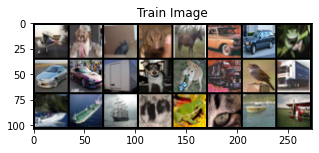

In [ ]:
images, labels = iter(train_loader).next()
imshow(torchvision.utils.make_grid(images, normalize=True), "Train Image")

In [ ]:
model, best_acc = model_cifar('resnet18', ckpt_path = '/content/resnet18.pth')
print(best_acc)

94.02


In [ ]:
model = model.eval().cuda()

In [ ]:
!pip install ipython-autotime

time: 3.47 s (started: 2021-12-17 17:56:55 +00:00)


In [ ]:
atk = PGD(model, eps=2/255, alpha=2/255, steps=4)
atk.set_return_type('int') # Save as integer.
atk.save(data_loader=test_loader, save_path="./data/cifar10_pgd.pt", verbose=True)
%load_ext autotime

- Save progress: 100.00 % / Robust accuracy: 11.79 % / L2: 0.37991 (0.238 it/s) 	
- Save complete!
The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
time: 2min 6s (started: 2021-12-17 18:04:09 +00:00)


In [ ]:
atk = PGD(model, eps=0.5/255, alpha=2/255, steps=2)
atk.set_return_type('int') # Save as integer.
atk.save(data_loader=test_loader, save_path="./data/cifar10_pgd_weak.pt", verbose=True)
%load_ext autotime

- Save progress: 100.00 % / Robust accuracy: 75.00 % / L2: 0.10844 (0.127 it/s) 	
- Save complete!
The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
time: 1min 8s (started: 2021-12-17 17:59:07 +00:00)


In [ ]:
atk = FGSM(model, eps=0.1)
atk.set_return_type('int') # Save as integer.
atk.save(data_loader=test_loader, save_path="./data/cifar10_fgsm.pt", verbose=True)
%load_ext autotime

- Save progress: 100.00 % / Robust accuracy: 10.23 % / L2: 5.42471 (0.071 it/s) 	
- Save complete!
The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
time: 39.9 s (started: 2021-12-17 18:15:03 +00:00)


In [ ]:
atk = FGSM(model, eps=0.002)
atk.set_return_type('int') # Save as integer.
atk.save(data_loader=test_loader, save_path="./data/cifar10_fgsm_weak.pt", verbose=True)
%load_ext autotime

- Save progress: 100.00 % / Robust accuracy: 75.80 % / L2: 0.11060 (0.070 it/s) 	
- Save complete!
The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
time: 39.9 s (started: 2021-12-17 17:57:24 +00:00)


In [ ]:
epsoptions = [1, 0.9, 0.8, 0.7, 0.6, 0.5, 0.4, 0.3, 0.2, 0.1]

for epsval in epsoptions:
    print(epsval)
    atk = FGSM(model, eps = epsval)
    atk.set_return_type('int') # Save as integer.
    atk.save(data_loader=test_loader, save_path="./data/cifar10_fgsm.pt", verbose=True)

In [ ]:
epsoptions = [0.0005 * i for i in range(1, 200)]

for epsval in epsoptions:
    print(epsval)
    atk = FGSM(model, eps = epsval)
    atk.set_return_type('int') # Save as integer.
    atk.save(data_loader=test_loader, save_path="./data/cifar10_fgsm.pt", verbose=True)

In [ ]:
### Save outputs above as text file and run following code to parse and create plot
import pandas as pd

def parse_output(filepath):
    f = open(filepath, 'r')
    texts = f.readlines()
    eps = []
    accuracy = []
    for i in range(len(texts)):
        curtext = texts[i].replace('\n', '')
        if i % 3 == 0:
            eps.append(float(curtext))
        if i % 3 == 1:
            splitted = curtext.split('Robust accuracy: ')
            acc = float(splitted[-1].split(' %')[0])
            accuracy.append(acc)
        
    f.close()
    return pd.DataFrame([eps, accuracy], index = ['epsilon', 'robust accuracy']).transpose()

check = parse_output("C:/Users/ChungPC/Documents/test.txt")
check = check.sort_values(by = 'epsilon', ascending = True)

check1 = check[check['epsilon'] <= 0.1]
plt.xlabel("Epsilon")
plt.ylabel("Robustness Accuracy %")
plt.xticks(np.arange(0, 0.12, 0.01), rotation = 45)
plt.yticks(np.arange(0, 102, 10))
plt.plot(check1['epsilon'], check1['robust accuracy'])

check2 = check[check['epsilon'] >= 0.1]
plt.xlabel("Epsilon")
plt.ylabel("Robustness Accuracy %")
plt.xticks(np.arange(0.1, 1.2, 0.1), rotation = 45)
plt.yticks(np.arange(0, 15, 1))
plt.plot(check2['epsilon'], check2['robust accuracy'])


In [ ]:
adv_images_strong, adv_labels_strong = torch.load("./data/cifar10_fgsm.pt")
adv_data_strong = TensorDataset(adv_images_strong.float()/255, adv_labels_strong)
adv_loader_strong = DataLoader(adv_data_strong, batch_size=24, shuffle=False)

time: 105 ms (started: 2021-12-17 20:36:53 +00:00)


In [ ]:
adv_images_weak, adv_labels_weak = torch.load("./data/cifar10_fgsm_weak.pt")
adv_data_weak = TensorDataset(adv_images_weak.float()/255, adv_labels_weak)
adv_loader_weak = DataLoader(adv_data_weak, batch_size=24, shuffle=False)

time: 119 ms (started: 2021-12-17 20:36:57 +00:00)


In [ ]:
# clean accuracy

In [ ]:
'''
model.eval()

correct = 0
total = 0
# 'attack' with perturbed images
for images, labels in test_loader:
    
    images = images.cuda()
    outputs = model(images)
    
    _, predicted = torch.max(outputs.data, 1)
    
    total += labels.size(0)
    correct += (predicted == labels.cuda()).sum()
    
print('Standard accuracy: %.2f %%' % (100 * float(correct) / total))
'''

"\nmodel.eval()\n\ncorrect = 0\ntotal = 0\n# 'attack' with perturbed images\nfor images, labels in test_loader:\n    \n    images = images.cuda()\n    outputs = model(images)\n    \n    _, predicted = torch.max(outputs.data, 1)\n    \n    total += labels.size(0)\n    correct += (predicted == labels.cuda()).sum()\n    \nprint('Standard accuracy: %.2f %%' % (100 * float(correct) / total))\n"

In [ ]:
# robust accuracy

In [ ]:
'''
model.eval()

correct = 0
total = 0

for images, labels in adv_loader:
    
    images = images.cuda()
    outputs = model(images)
    
    _, predicted = torch.max(outputs.data, 1)
    
    total += labels.size(0)
    correct += (predicted == labels.cuda()).sum()
    
print('Robust accuracy: %.2f %%' % (100 * float(correct) / total))
'''

"\nmodel.eval()\n\ncorrect = 0\ntotal = 0\n\nfor images, labels in adv_loader:\n    \n    images = images.cuda()\n    outputs = model(images)\n    \n    _, predicted = torch.max(outputs.data, 1)\n    \n    total += labels.size(0)\n    correct += (predicted == labels.cuda()).sum()\n    \nprint('Robust accuracy: %.2f %%' % (100 * float(correct) / total))\n"

In [ ]:
# Per-class accuracy
model.eval()

countdict = {}

for images, labels in adv_loader_strong:
    images = images.cuda()
    outputs = model(images)
    
    _, predicted = torch.max(outputs.data, 1)
    for i in range(len(labels)):
        curlabel = int(labels[i])
        curpred = int(predicted[i])
        if curlabel in countdict.keys():
            countdict[curlabel]['total'] += 1
            countdict[curlabel]['correct'] += (curpred == curlabel)
        else:
            countdict[curlabel] = {}
            countdict[curlabel]['total'] = 1
            countdict[curlabel]['correct'] = (curpred == curlabel)

countdf = pd.DataFrame(countdict).transpose()
countdf['Accuracy'] = countdf['correct']/countdf['total']
countdf = countdf.sort_index()
countdf.to_csv("/content/perclass_fgsm_strong.csv")

model.eval()

countdict = {}

for images, labels in adv_loader_weak:
    images = images.cuda()
    outputs = model(images)
    
    _, predicted = torch.max(outputs.data, 1)
    for i in range(len(labels)):
        curlabel = int(labels[i])
        curpred = int(predicted[i])
        if curlabel in countdict.keys():
            countdict[curlabel]['total'] += 1
            countdict[curlabel]['correct'] += (curpred == curlabel)
        else:
            countdict[curlabel] = {}
            countdict[curlabel]['total'] = 1
            countdict[curlabel]['correct'] = (curpred == curlabel)

countdf = pd.DataFrame(countdict).transpose()
countdf['Accuracy'] = countdf['correct']/countdf['total']
countdf = countdf.sort_index()
countdf.to_csv("/content/perclass_fgsm_weak.csv")

In [ ]:
import os
os.chdir("/content/")
! git clone https://github.com/jacobgil/pytorch-grad-cam.git

Cloning into 'pytorch-grad-cam'...
remote: Enumerating objects: 694, done.
remote: Counting objects: 100% (211/211), done.
remote: Compressing objects: 100% (72/72), done.
remote: Total 694 (delta 164), reused 139 (delta 139), pack-reused 483
Receiving objects: 100% (694/694), 1.88 MiB | 12.29 MiB/s, done.
Resolving deltas: 100% (381/381), done.


In [ ]:
os.chdir("/content/pytorch-grad-cam/")
!pip install ttach

time: 3.19 s (started: 2021-12-17 20:37:20 +00:00)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:107: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Avg Dice Loss on Strong Perturbation (Thres 200): 0.5749918559191712
Avg Dice Loss on Weak Perturbation (Thres 200): 0.8290027509187988
Avg Dice Loss on Strong Perturbation (Thres 150): 0.6746219130445824
Avg Dice Loss on Weak Perturbation (Thres 150): 0.869404951591323


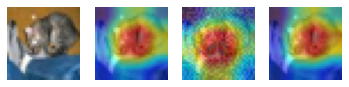

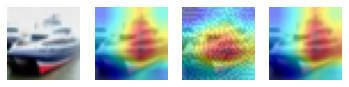

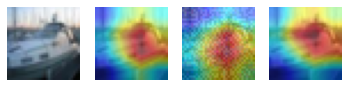

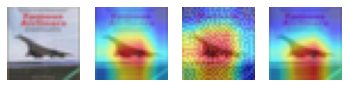

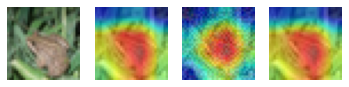

...

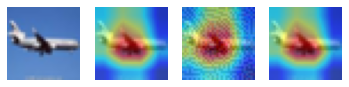

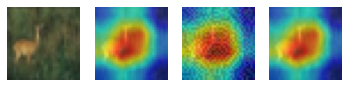

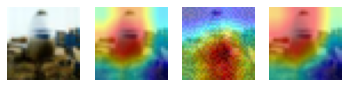

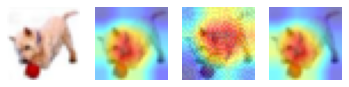

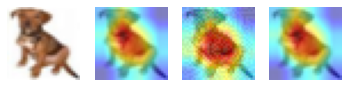

time: 1min 17s (started: 2021-12-17 20:53:13 +00:00)


In [ ]:
from pytorch_grad_cam import GradCAM
from google.colab.patches import cv2_imshow
import cv2
from pytorch_grad_cam.utils.image import show_cam_on_image

target_layer = model[1].module.layer4[-1]

# IoU calculation..
# binary class (one-hot vector) version

def dice_loss(base_att, target_att):
  axes = (1, 2)
  intersection = np.sum(np.abs(target_att * base_att), axis=axes)
  mask_sum = np.sum(np.abs(base_att), axis=axes) + np.sum(np.abs(target_att), axis=axes)
  union = mask_sum - intersection
  smooth = 0.000001
  iou_score = (intersection + smooth) / (union + smooth)
  dice_score = 2 * (intersection + smooth) / (mask_sum + smooth)
    
  return dice_score

def batch_evaluate(clean_loader, strong_loader, weak_loader, model):
  total_length = len(clean_loader)
  
  cam= GradCAM(model=model, target_layers=[target_layer], use_cuda= True)
  count=0
  strong_loss = 0
  weak_loss = 0
  strong_loss2 = 0
  weak_loss2 = 0
  clean_loader_iter = iter(clean_loader)
  strong_loader_iter = iter(strong_loader)
  weak_loader_iter = iter(weak_loader)
  
  for i in range(total_length):
      clean_batch, clean_labels = next(clean_loader_iter)
      strong_batch, strong_labels = next(strong_loader_iter)
      weak_batch, weak_labels = next(weak_loader_iter)
      batch_size = clean_batch.shape[0]
      
      for index in range(batch_size):
        x_clean = clean_batch[index] # 3, 32, 32
        x_clean_swap = clean_batch[index].permute(1, 2, 0) # 32, 32, 3
        gt_label = clean_labels[index]

        x_strong = strong_batch[index]
        x_strong_swap = strong_batch[index].permute(1, 2, 0)
        strong_label = strong_labels[index]

        x_weak = weak_batch[index]
        x_weak_swap = weak_batch[index].permute(1, 2, 0)
        weak_label = weak_labels[index]

        grayscale_cam1 = cam(input_tensor=x_clean, target_category=None)[0, :]
        heatmap1 = cv2.applyColorMap(np.uint8(255 * grayscale_cam1), cv2.COLORMAP_JET)
        heatmap1 = cv2.cvtColor(heatmap1, cv2.COLOR_BGR2RGB)
        heatmap1 = np.swapaxes(heatmap1,0,2)
        heatmap1 = (np.swapaxes(heatmap1,1,2))
        heatmap1 = np.float32(heatmap1) / 255
        heatmap1 = heatmap1 / np.max(heatmap1)
        heatmap1 = np.uint8(255 * heatmap1)

        grayscale_cam2 = cam(input_tensor=x_strong, target_category=None)[0, :]
        heatmap2 = cv2.applyColorMap(np.uint8(255 * grayscale_cam2), cv2.COLORMAP_JET)
        heatmap2 = cv2.cvtColor(heatmap2, cv2.COLOR_BGR2RGB)
        heatmap2 = np.swapaxes(heatmap2,0,2)
        heatmap2 = (np.swapaxes(heatmap2,1,2))
        heatmap2 = np.float32(heatmap2) / 255
        heatmap2 = heatmap2 / np.max(heatmap2)
        heatmap2 = np.uint8(255 * heatmap2)     

        grayscale_cam3 = cam(input_tensor=x_weak, target_category=None)[0, :]
        heatmap3 = cv2.applyColorMap(np.uint8(255 * grayscale_cam3), cv2.COLORMAP_JET)
        heatmap3 = cv2.cvtColor(heatmap3, cv2.COLOR_BGR2RGB)
        heatmap3 = np.swapaxes(heatmap3,0,2)
        heatmap3 = (np.swapaxes(heatmap3,1,2))
        heatmap3 = np.float32(heatmap3) / 255
        heatmap3 = heatmap3 / np.max(heatmap3)
        heatmap3 = np.uint8(255 * heatmap3)   

        x_clean_n = x_clean_swap.numpy()
        cam_image_clean = show_cam_on_image(x_clean_n, grayscale_cam1, use_rgb=True)

        x_strong_n = x_strong_swap.numpy()
        cam_image_strong = show_cam_on_image(x_strong_n, grayscale_cam2, use_rgb=True)

        x_weak_n = x_weak_swap.numpy()
        cam_image_weak = show_cam_on_image(x_weak_n, grayscale_cam3, use_rgb=True)

        clean_thres_att = (heatmap1 > 200).astype(int)
        strong_thres_att = (heatmap2 > 200).astype(int)
        weak_thres_att = (heatmap3 > 200).astype(int)

        strong_loss += dice_loss(clean_thres_att, strong_thres_att)
        weak_loss += dice_loss(clean_thres_att, weak_thres_att)

        clean_thres_att2 = (heatmap1 > 150).astype(int)
        strong_thres_att2 = (heatmap2 > 150).astype(int)
        weak_thres_att2 = (heatmap3 > 150).astype(int)

        strong_loss2 += dice_loss(clean_thres_att2, strong_thres_att2)
        weak_loss2 += dice_loss(clean_thres_att2, weak_thres_att2)

        count = count+1
   
        
        f, axarr = plt.subplots(1,4)
        axarr[0].axis('off')
        axarr[1].axis('off')
        axarr[2].axis('off')
        axarr[3].axis('off')
        axarr[0].imshow(x_clean_n)
        axarr[1].imshow(cam_image_clean)
        axarr[2].imshow(cam_image_strong)   
        axarr[3].imshow(cam_image_weak)   
        f.show()
        
      
  return strong_loss/count, weak_loss/count, strong_loss2/count, weak_loss2/count 

avg_strong_loss, avg_weak_loss, avg_strong_loss2, avg_weak_loss2 = batch_evaluate(test_loader, adv_loader_strong, adv_loader_weak, model)
print("Avg Dice Loss on Strong Perturbation (Thres 200): " + str(np.mean(avg_strong_loss)))
print("Avg Dice Loss on Weak Perturbation (Thres 200): " + str(np.mean(avg_weak_loss)))
print("Avg Dice Loss on Strong Perturbation (Thres 150): " + str(np.mean(avg_strong_loss2)))
print("Avg Dice Loss on Weak Perturbation (Thres 150): " + str(np.mean(avg_weak_loss2)))